# Mask R-CNN Demo - Detect Crater and Sand-Dune

A quick intro to using the pre-trained model to detect and segment objects.

The output for sand-dune isn't good as I had providedvery less annotations for the sand-dune in order to setup the pipeline.

In [1]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import CRATER config
sys.path.append(os.path.join(ROOT_DIR, "samples/anomaly/"))  # To find local version
import anomaly

%matplotlib inline 

# Directory to save the trained model
MODEL_DIR = os.path.join(ROOT_DIR, "weights")

# Local path to trained weights file
CRATER_MODEL_PATH = os.path.join(ROOT_DIR, "weights/anomaly/mask_rcnn_anomaly_0015.h5")

# Directory of images to run detection on
DATA_SOURCE_DIR_NAME = "JPL_NASA_2"
IMAGE_DIR = os.path.join(ROOT_DIR, "datasets/" + DATA_SOURCE_DIR_NAME + "/anomaly/test")

Using TensorFlow backend.


## Configurations

We'll be using a model trained on the MS-CRATER dataset. The configurations of this model are in the ```CraterConfig``` class in ```crater.py```.

For inferencing, modify the configurations a bit to fit the task. To do so, sub-class the ```CraterConfig``` class and override the attributes you need to change.

In [2]:
class InferenceConfig(anomaly.AnomalyConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'mrcnn_bbox_loss': 1.0, 'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0, 'mrcnn_class_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Create Model and Load Trained Weights

In [3]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-CRATER
model.load_weights(CRATER_MODEL_PATH, by_name=True)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


## Class Names

The model classifies objects and returns class IDs, which are integer value that identify each class. Some datasets assign integer values to their classes and some don't. For example, in the MS-CRATER dataset, the 'crater' class is 1.

To improve consistency, and to support training on data from multiple sources at the same time, our ```Dataset``` class assigns it's own sequential integer IDs to each class. For example, if you load the CRATER dataset using our ```Dataset``` class, the 'person' class would get class ID = 1 (just like CRATER) and the 'teddy bear' class is 78 (different from CRATER). Keep that in mind when mapping class IDs to class names.

To get the list of class names, you'd load the dataset and then use the ```class_names``` property like this.
```
# Load CRATER dataset
dataset = crater.CocoDataset()
dataset.load_crater(CRATER_DIR, "train")
dataset.prepare()

# Print class names
print(dataset.class_names)
```

In [4]:
# CRATER Class names
class_names = ["","crater", "sand-dune"]

## Run Object Detection

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


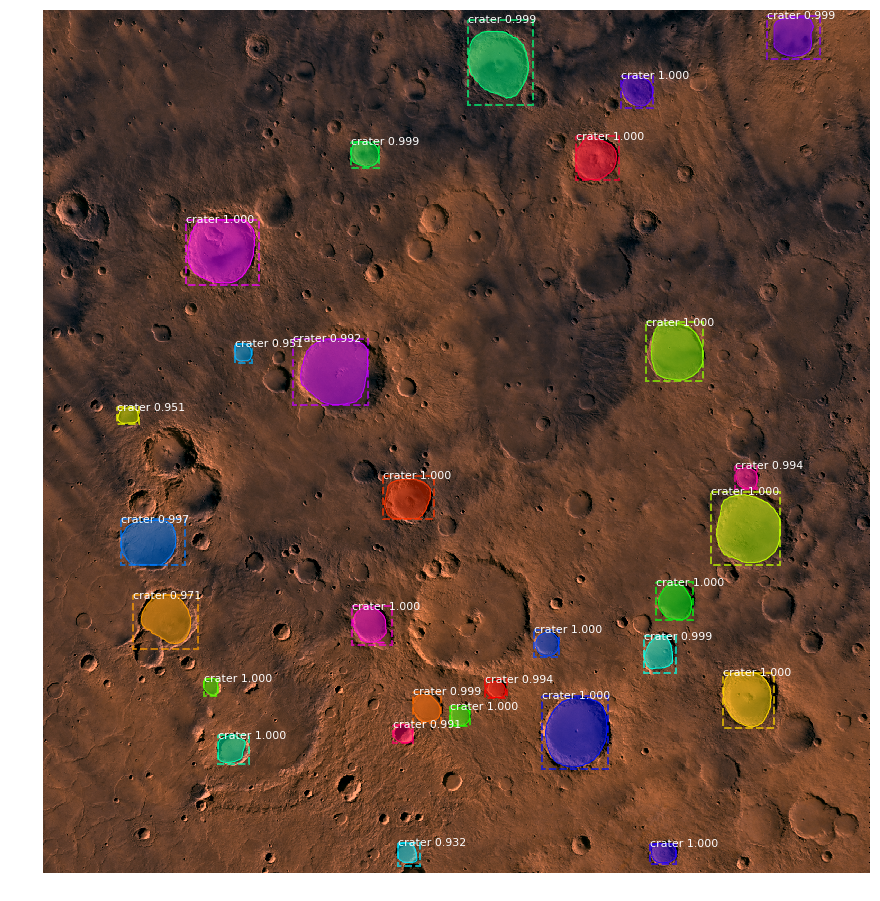

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


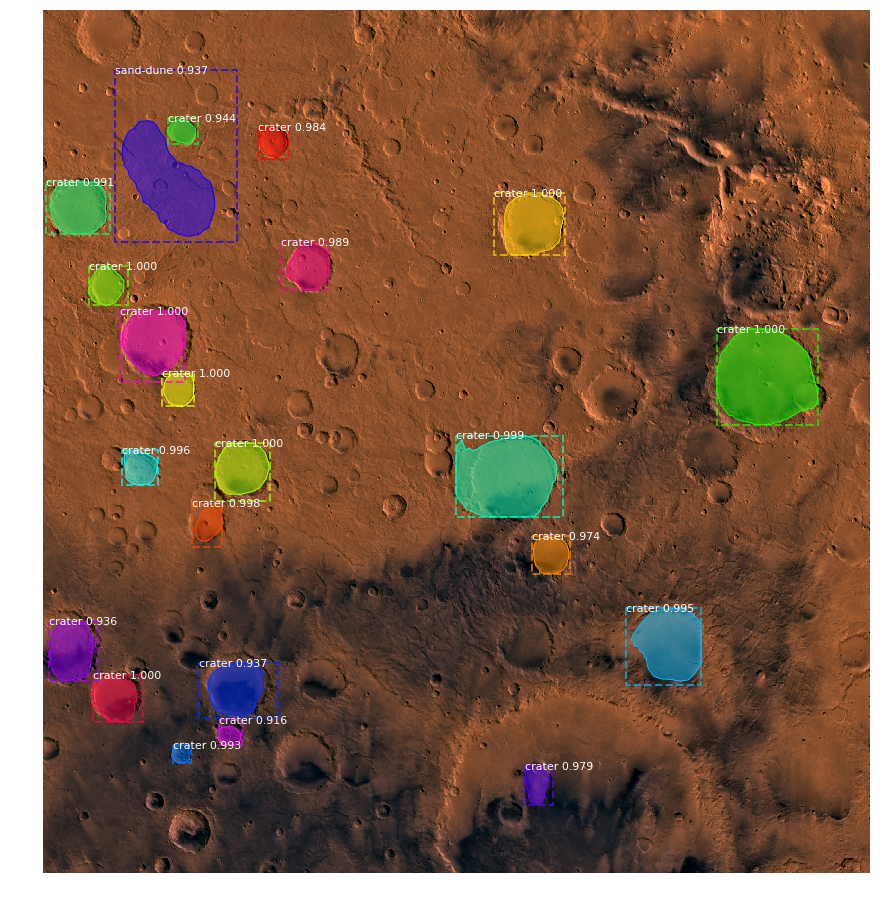

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


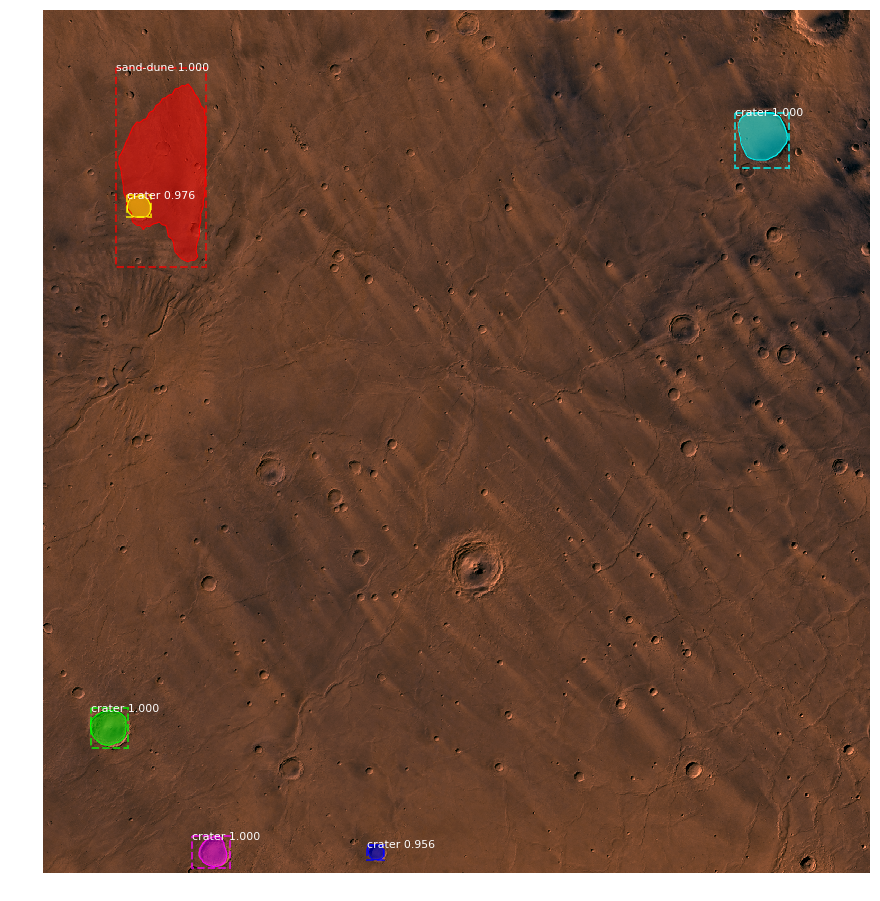

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  247.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  121.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


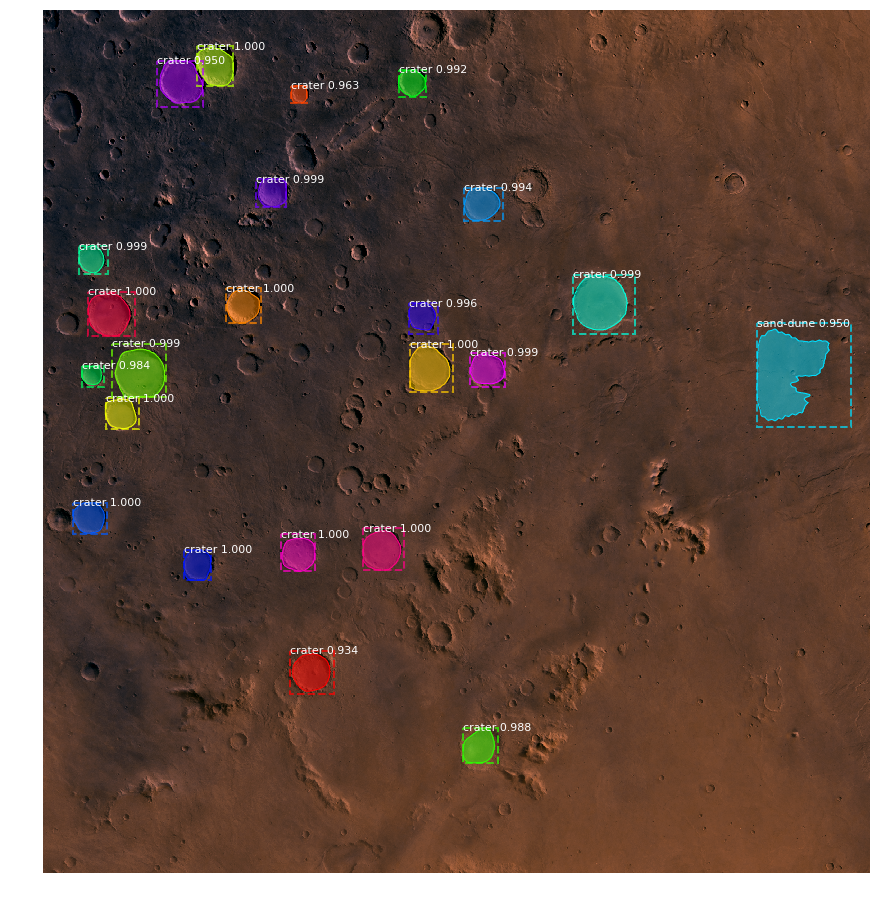

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


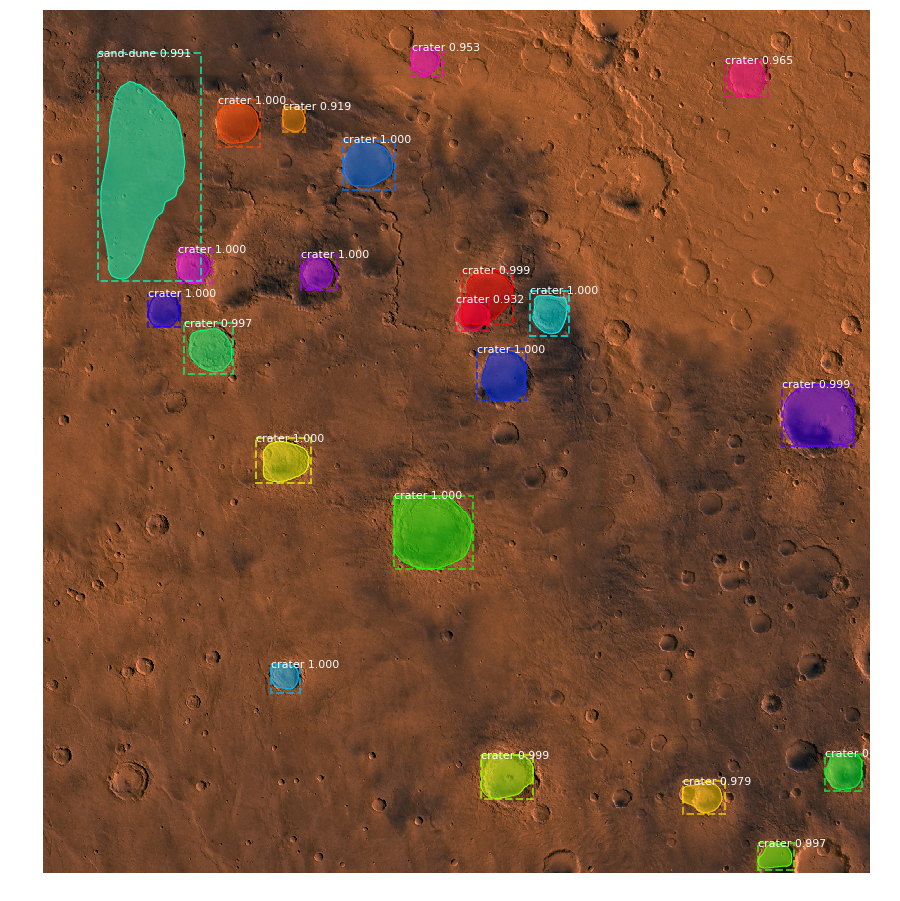

Processing 1 images
image                    shape: (2495, 2390, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 2495.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


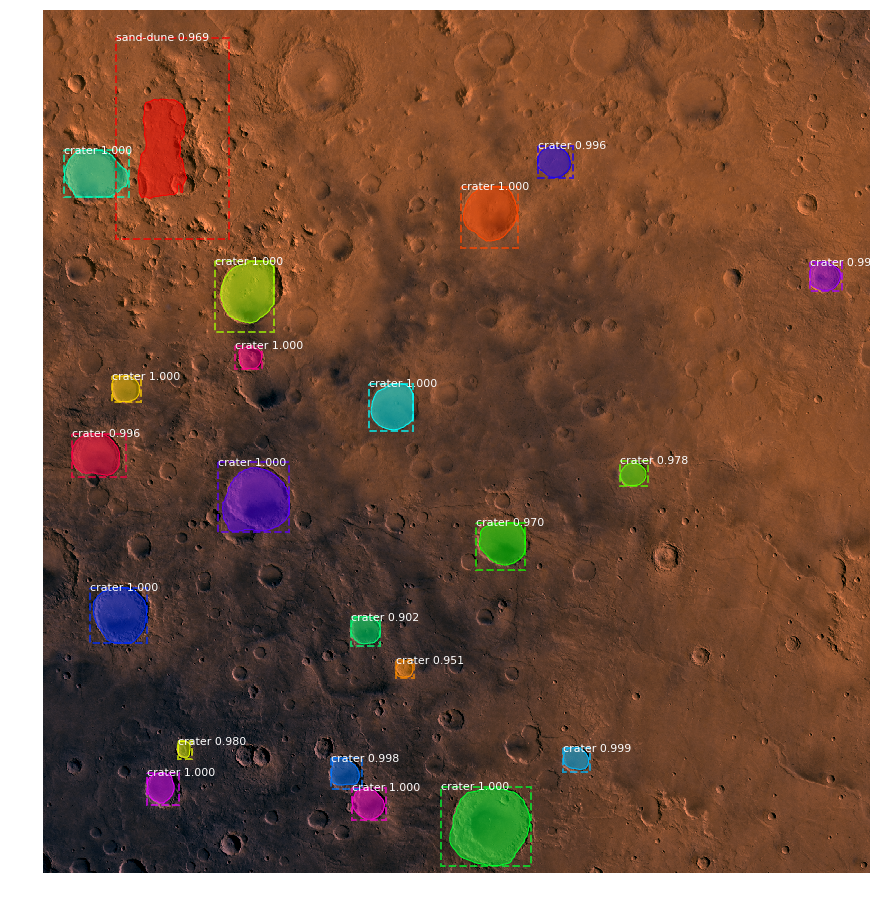

In [5]:
# Load a random image from the images folder
file_names = next(os.walk(IMAGE_DIR))[2]

for file in file_names:
    image = skimage.io.imread(os.path.join(IMAGE_DIR, file))

    # Run detection
    results = model.detect([image], verbose=1)

    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'])
